En este problema se busca determinar el tipo de marca que aparece en los fotogramas de un video, siendo posible que este corresponda a la marca de Pepsi o de Coca-Cola.

In [1]:
#Importar todas las librerias necesarias
import cv2
import numpy as np
import zipfile
import os
import matplotlib.pyplot as plt
import io
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import datasets, layers, models
from google.colab import files

In [2]:
#Se carga el archivo con las imagenes de entrenamiento
uploaded = files.upload()
#Se extrae el contenido del archivo
datos = zipfile.ZipFile(io.BytesIO(uploaded['imagenesEntrenamiento.zip']), 'r')
datos.extractall()

Saving imagenesEntrenamiento.zip to imagenesEntrenamiento.zip


In [3]:
#Se define la ruta de los logos de Coca Cola
ruta_CocaCola = "/content/Cocacola"
imagen_size = 128
cocaCola = []

#Se transforma a RGB y se cambia el tamaño de las imagenes de los logos de Coca Cola
for imagen in os.listdir(ruta_CocaCola):
  imagen = cv2.imread(os.path.join(ruta_CocaCola,imagen))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)
  imagen_resize = cv2.resize(imagen,(imagen_size,imagen_size))
  cocaCola.append(imagen_resize)


#Se define la ruta de los logos de Pepsi
ruta_Pepsi = "/content/Pepsi"
pepsi = []

#Se transforma a RGB y se cambia el tamaño de los logos de Pepsi
for imagen in os.listdir(ruta_Pepsi):
  imagen = cv2.imread(os.path.join(ruta_Pepsi,imagen))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)
  imagen_resize = cv2.resize(imagen,(imagen_size,imagen_size))
  pepsi.append(imagen_resize)

In [4]:
#Unir todas las imagenes en una array de numpy
imagenes = np.concatenate([cocaCola,pepsi])
#Crear etiquetas para las imagenes colocando 0 a los logos de Coca Cola y 1 a los logos de Pepsi
etiquetas_cocaCola = np.repeat(0,len(cocaCola))
etiquetas_pepsi = np.repeat(1,len(pepsi))
#Se procede a concatener las etiquetas
etiquetas = np.concatenate([etiquetas_cocaCola,etiquetas_pepsi])
#Colocar nombres a cada clase
class_name = ['cocaCola','pepsi']

In [5]:
#Crear el modelo
modelo = keras.Sequential([
    #Se colocan dos capas convolucionales de dos dimensiones, seguida cada una de una capa de max pooling
    #a la primera capa convolucional se le colocan 32 filtros y a la segunda 64
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),#Se recibe como entrada el tamaño de la imagen y los colores
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    #Se coloca una capa flatten
    layers.Flatten(),
    #Se colocan dos capas densas
    layers.Dense(128, activation='relu'),
    #Se colocan dos neuronas porque se busca clasificar entre 2 estados posibles y se utliza la funcion de activacion softmax para obtener la probabilidad
    layers.Dense(2, activation='softmax')
])

In [6]:
#Se compila el modelo utilizando el optimizador adam
modelo.compile(optimizer='adam',
              #se usa la funcion de perdida sparse_categorical_crossentropy para calcular el error de la red neuronal
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

#Se entrena el modelo 30 veces
modelo.fit(imagenes, etiquetas, epochs=30)

Epoch 1/30
22/22 [==============================] - 11s 437ms/step - loss: 160.4311 - accuracy: 0.7795
Epoch 2/30
22/22 [==============================] - 10s 461ms/step - loss: 0.6587 - accuracy: 0.9573
Epoch 3/30
22/22 [==============================] - 10s 451ms/step - loss: 0.1288 - accuracy: 0.9858
Epoch 4/30
22/22 [==============================] - 9s 418ms/step - loss: 0.0354 - accuracy: 0.9915
Epoch 5/30
22/22 [==============================] - 10s 432ms/step - loss: 0.0161 - accuracy: 0.9972
Epoch 6/30
22/22 [==============================] - 10s 445ms/step - loss: 0.0147 - accuracy: 0.9986
Epoch 7/30
22/22 [==============================] - 10s 450ms/step - loss: 0.0113 - accuracy: 1.0000
Epoch 8/30
22/22 [==============================] - 9s 400ms/step - loss: 0.0091 - accuracy: 1.0000
Epoch 9/30
22/22 [==============================] - 10s 446ms/step - loss: 0.0077 - accuracy: 1.0000
Epoch 10/30
22/22 [==============================] - 10s 444ms/step - loss: 0.0065 - accura

In [7]:
#Se sube el video
uploaded = files.upload()
video_filename = list(uploaded.keys())[0]

#Se crea el directorio de los frames del video
output_folder = 'frames'
os.makedirs(output_folder, exist_ok=True)

#se lee el video
cap = cv2.VideoCapture(video_filename)

#Se obtiene la información del video
fps = int(cap.get(cv2.CAP_PROP_FPS))
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

#Se imprime la informacion del video
print(f'Número de fotogramas: {frame_count}')
print(f'FPS (fotogramas por segundo): {fps}')

#Se itera sobre los frames del video y se guardan en el directorio de salida
for i in range(frame_count):
    ret, frame = cap.read()

    #Se guarda en el directorio de salida
    frame_filename = os.path.join(output_folder, f'frame_{i+1:04d}.png')
    cv2.imwrite(frame_filename, frame)

#Se libera el objeto VideoCapture
cap.release()

Saving VideoPrueba.mp4 to VideoPrueba.mp4
Número de fotogramas: 126
FPS (fotogramas por segundo): 30


1/1 [==============================] - 0s 76ms/step


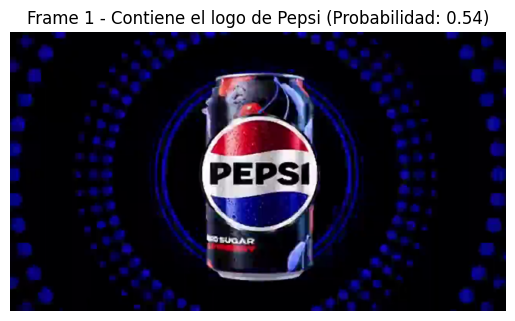

1/1 [==============================] - 0s 22ms/step


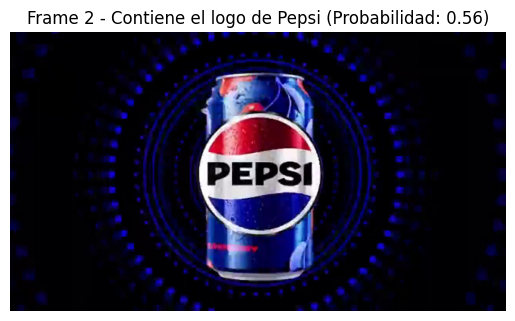

1/1 [==============================] - 0s 31ms/step


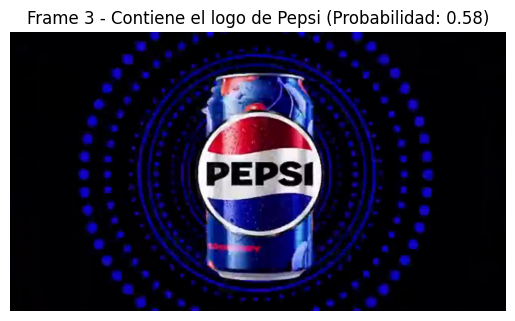

1/1 [==============================] - 0s 31ms/step


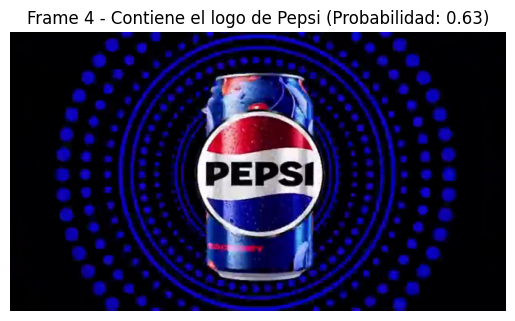

1/1 [==============================] - 0s 52ms/step


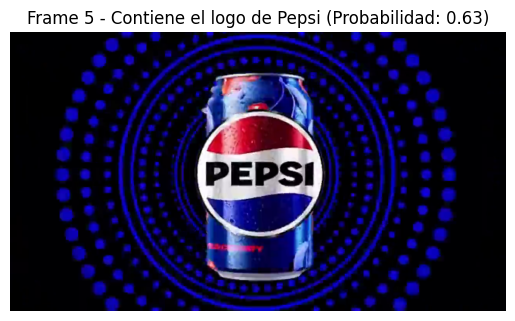

1/1 [==============================] - 0s 42ms/step


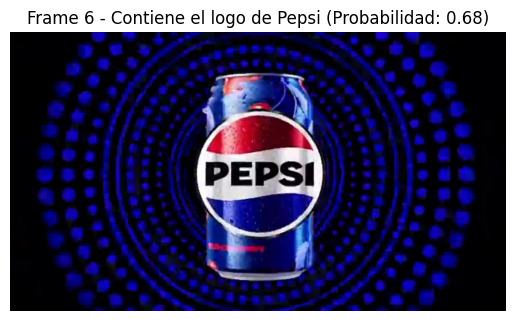

1/1 [==============================] - 0s 36ms/step


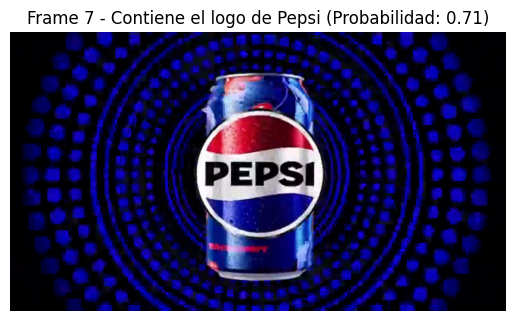

1/1 [==============================] - 0s 24ms/step


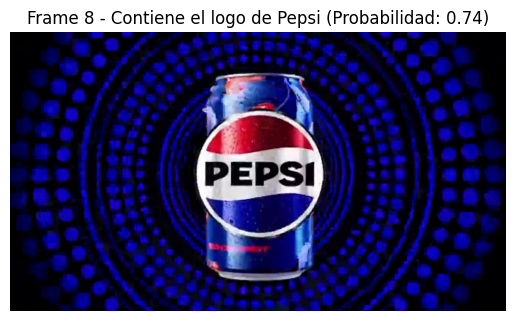

1/1 [==============================] - 0s 41ms/step


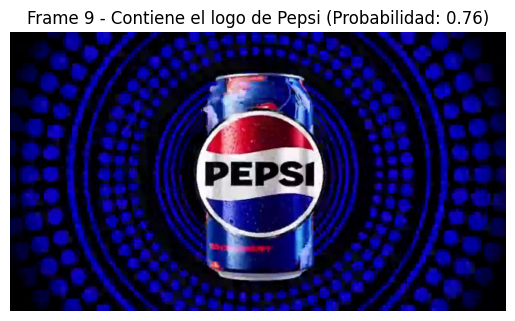

1/1 [==============================] - 0s 40ms/step


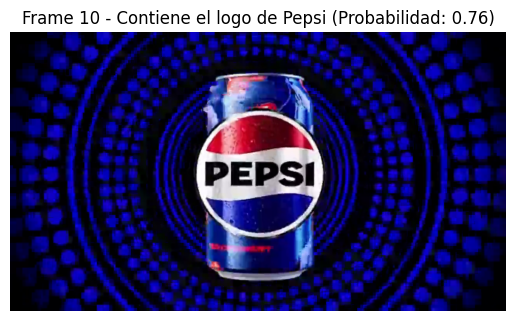

1/1 [==============================] - 0s 26ms/step


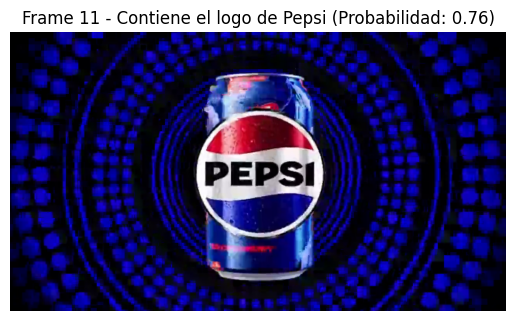

1/1 [==============================] - 0s 30ms/step


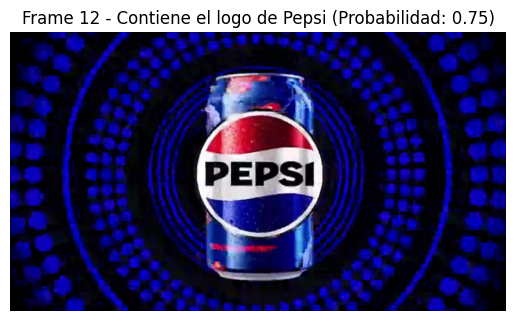

1/1 [==============================] - 0s 31ms/step


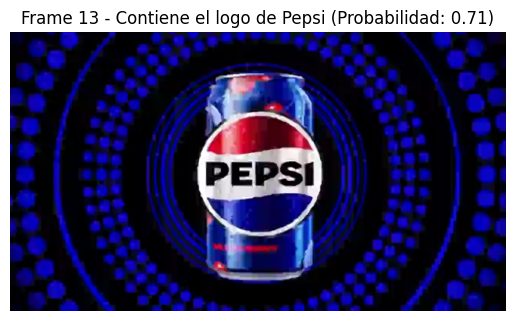

1/1 [==============================] - 0s 28ms/step


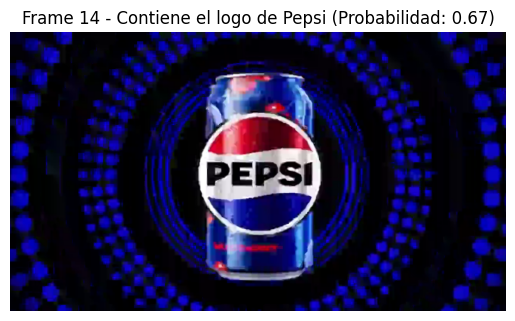

1/1 [==============================] - 0s 24ms/step


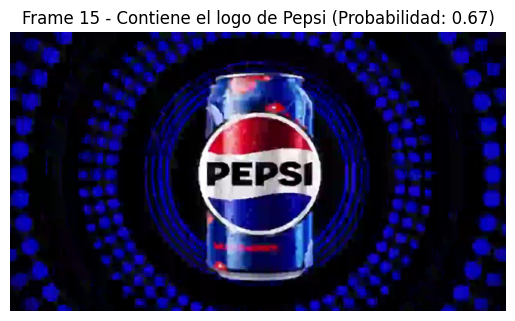

1/1 [==============================] - 0s 28ms/step


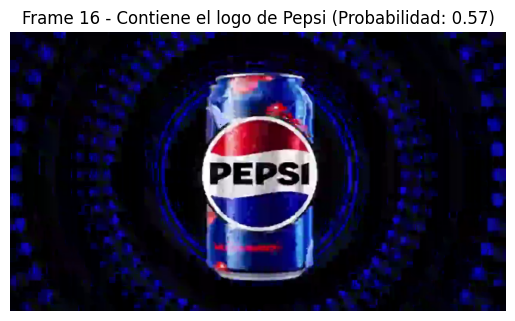

1/1 [==============================] - 0s 25ms/step


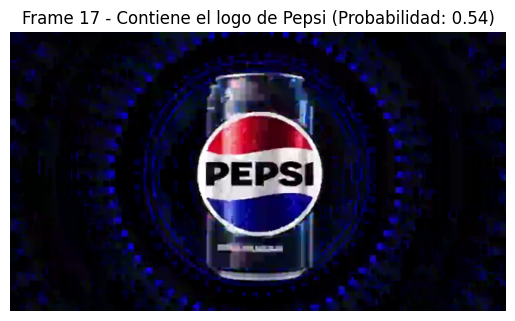

1/1 [==============================] - 0s 32ms/step


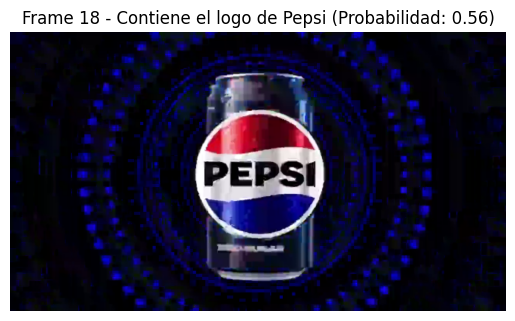

1/1 [==============================] - 0s 26ms/step


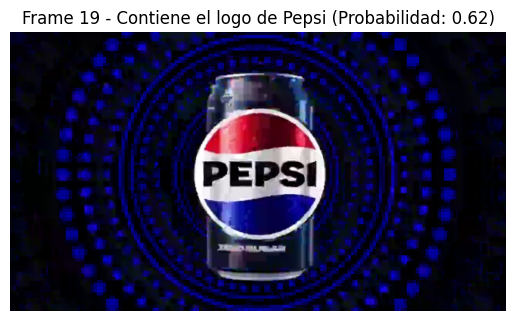

1/1 [==============================] - 0s 26ms/step


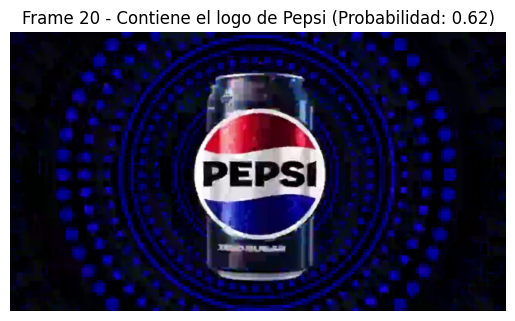

1/1 [==============================] - 0s 27ms/step


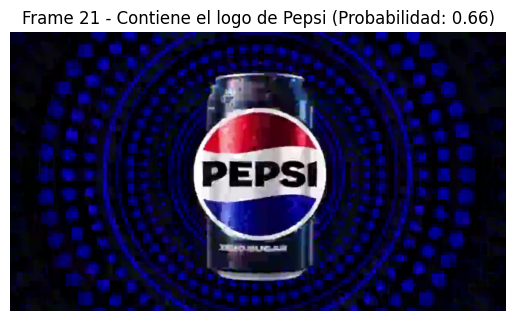

1/1 [==============================] - 0s 29ms/step


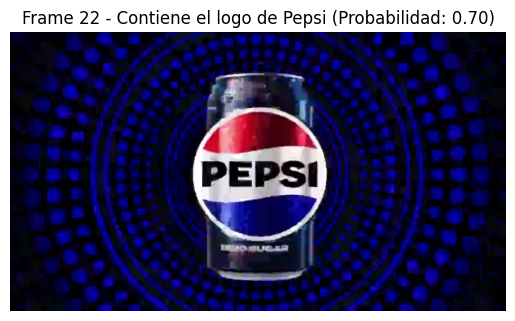

1/1 [==============================] - 0s 29ms/step


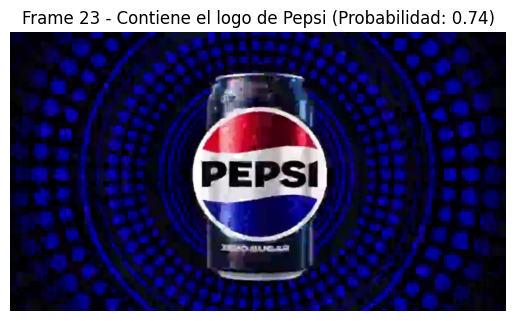

1/1 [==============================] - 0s 28ms/step


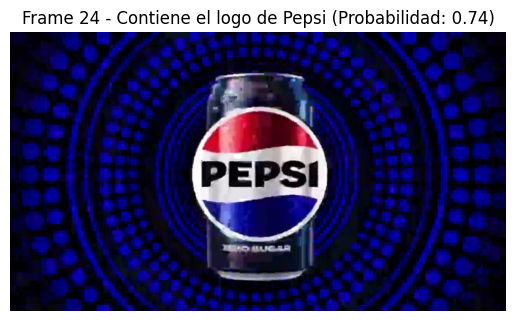

1/1 [==============================] - 0s 26ms/step


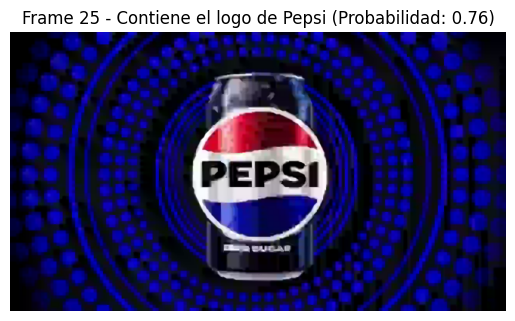

1/1 [==============================] - 0s 27ms/step


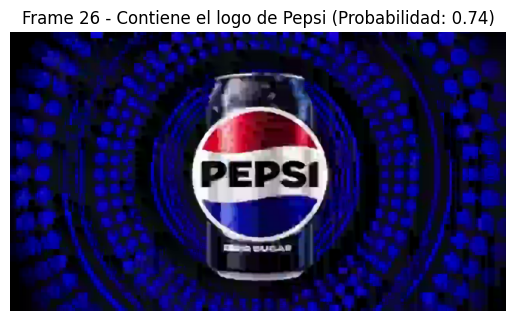

1/1 [==============================] - 0s 28ms/step


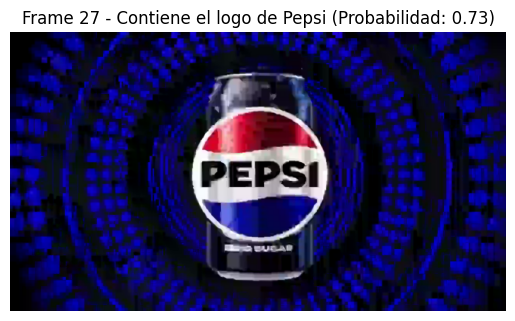

1/1 [==============================] - 0s 27ms/step


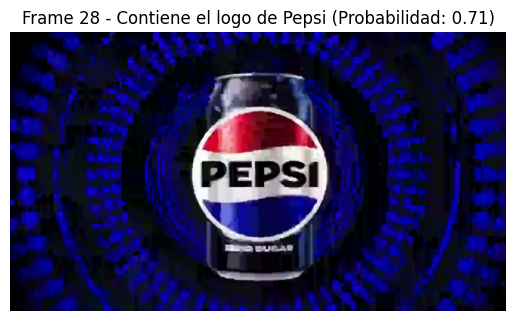

1/1 [==============================] - 0s 32ms/step


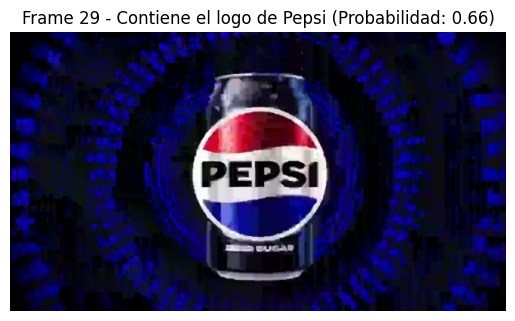

1/1 [==============================] - 0s 25ms/step


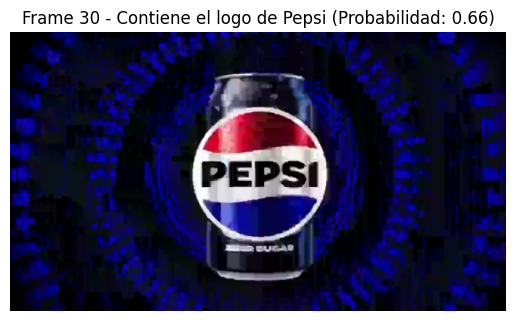

1/1 [==============================] - 0s 37ms/step


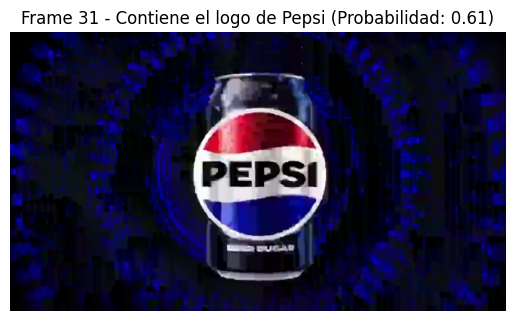

1/1 [==============================] - 0s 29ms/step


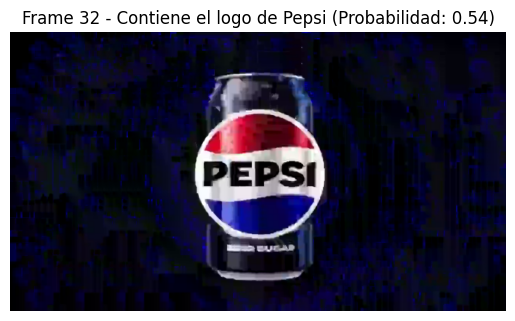

1/1 [==============================] - 0s 32ms/step


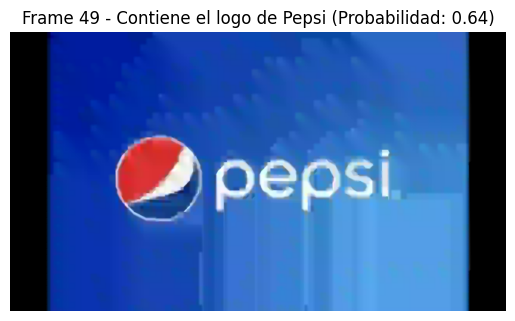

1/1 [==============================] - 0s 47ms/step


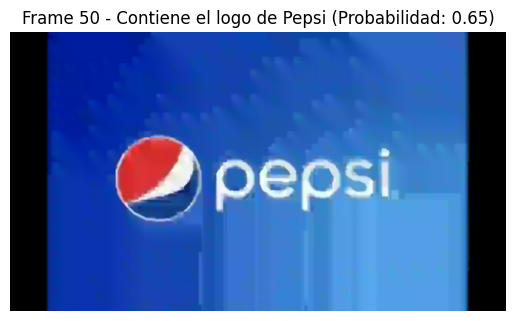

1/1 [==============================] - 0s 27ms/step


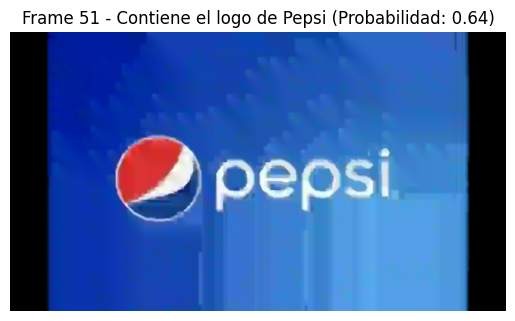

1/1 [==============================] - 0s 27ms/step


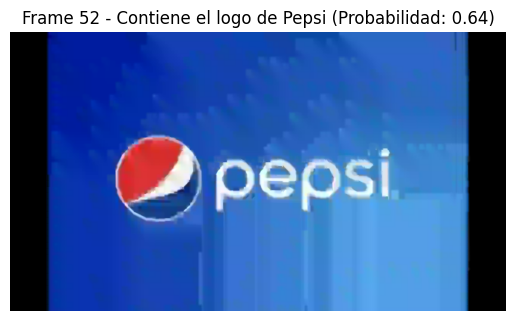

1/1 [==============================] - 0s 39ms/step


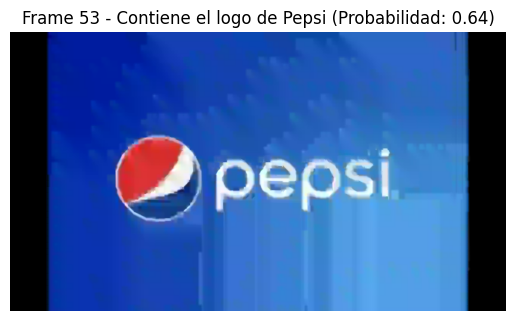

1/1 [==============================] - 0s 62ms/step


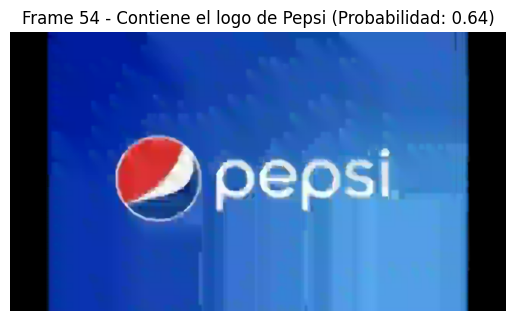

1/1 [==============================] - 0s 54ms/step


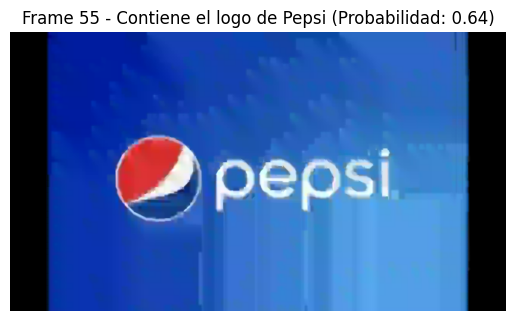

1/1 [==============================] - 0s 67ms/step


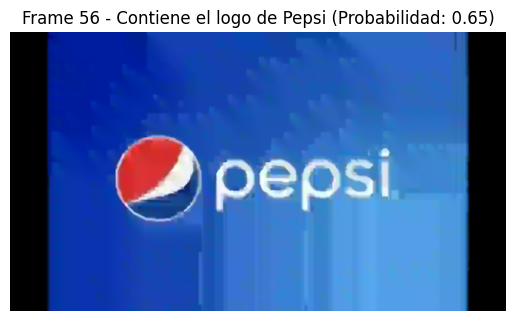

1/1 [==============================] - 0s 40ms/step


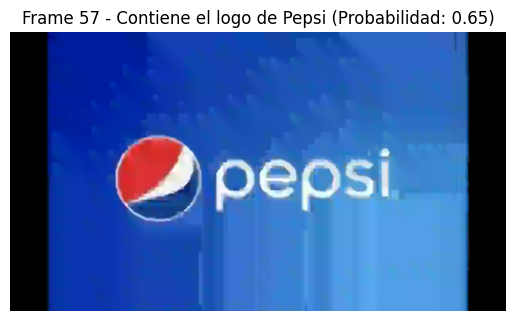

1/1 [==============================] - 0s 40ms/step


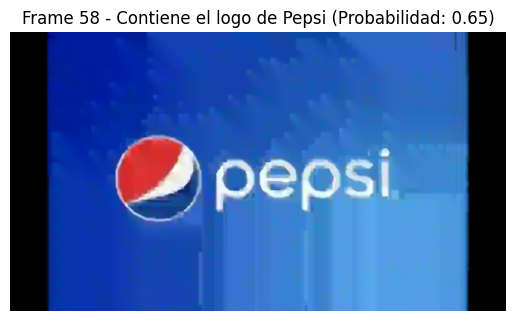

1/1 [==============================] - 0s 50ms/step


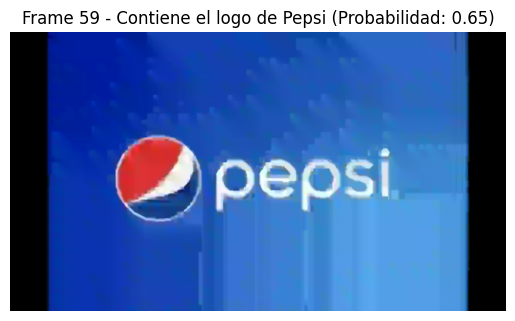

1/1 [==============================] - 0s 38ms/step


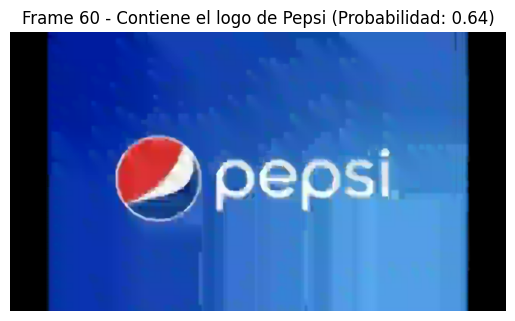

1/1 [==============================] - 0s 28ms/step


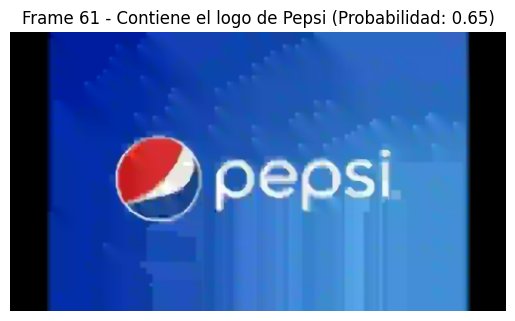

1/1 [==============================] - 0s 26ms/step


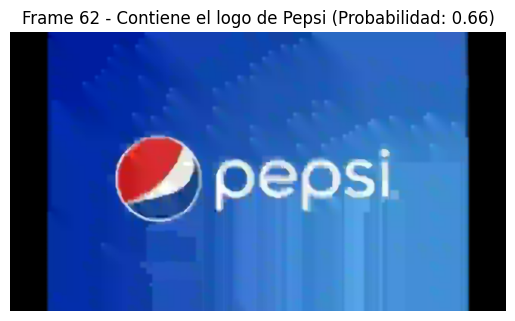

1/1 [==============================] - 0s 29ms/step


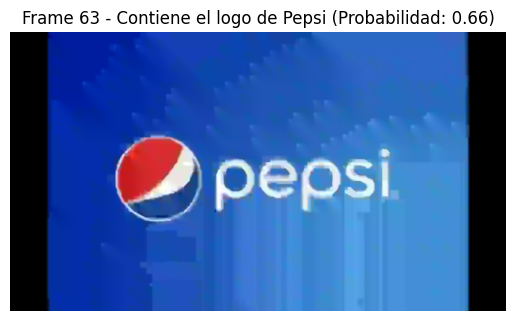

1/1 [==============================] - 0s 35ms/step


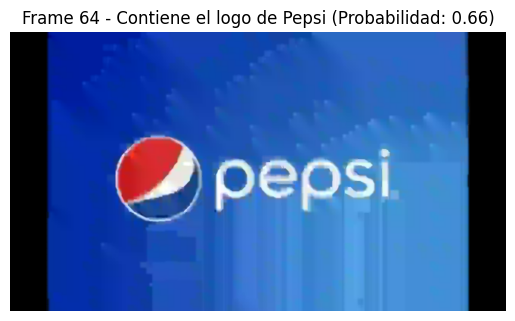

1/1 [==============================] - 0s 25ms/step


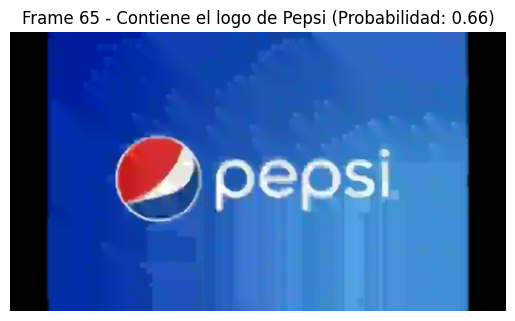

1/1 [==============================] - 0s 25ms/step


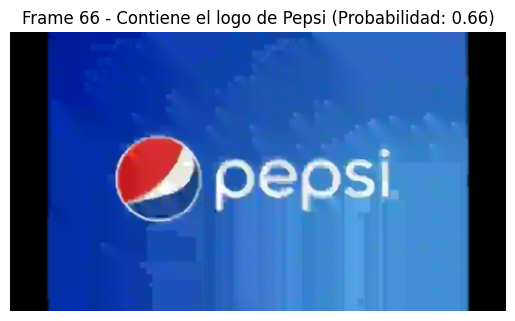

1/1 [==============================] - 0s 29ms/step


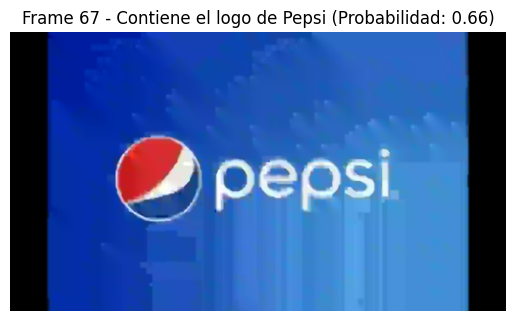

1/1 [==============================] - 0s 26ms/step


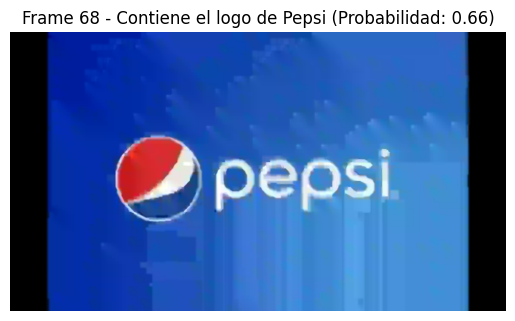

1/1 [==============================] - 0s 26ms/step


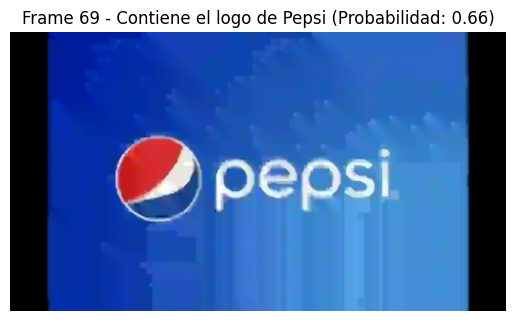

1/1 [==============================] - 0s 25ms/step


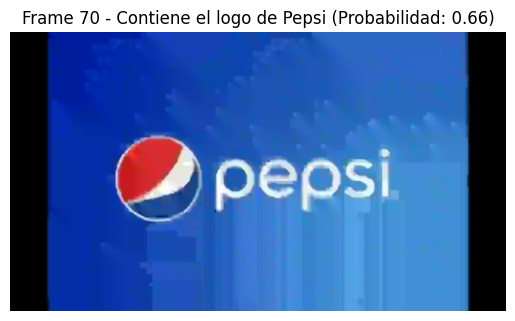

1/1 [==============================] - 0s 35ms/step


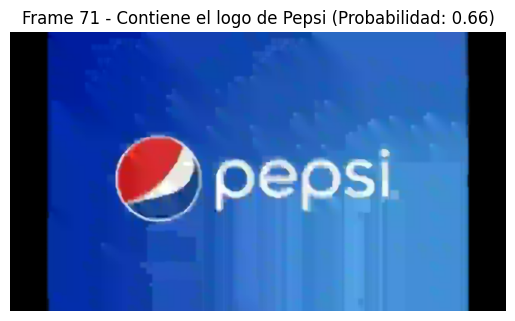

1/1 [==============================] - 0s 27ms/step


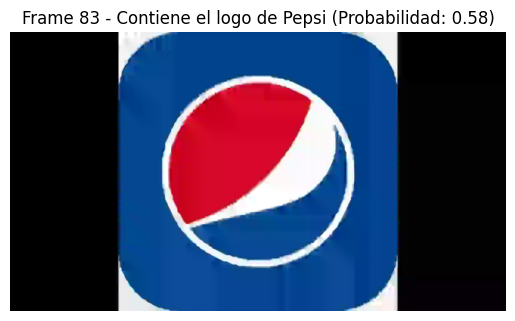

1/1 [==============================] - 0s 28ms/step


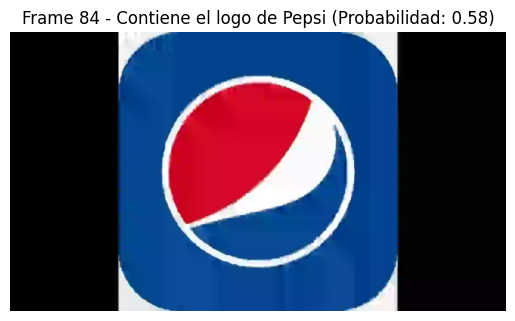

1/1 [==============================] - 0s 26ms/step


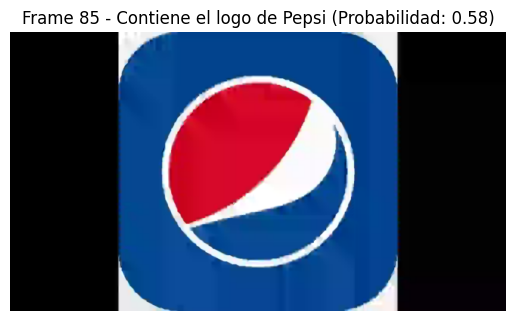

1/1 [==============================] - 0s 26ms/step


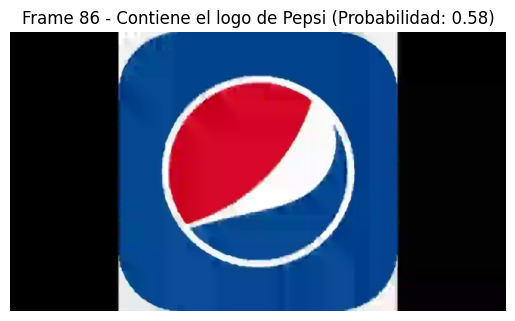

1/1 [==============================] - 0s 44ms/step


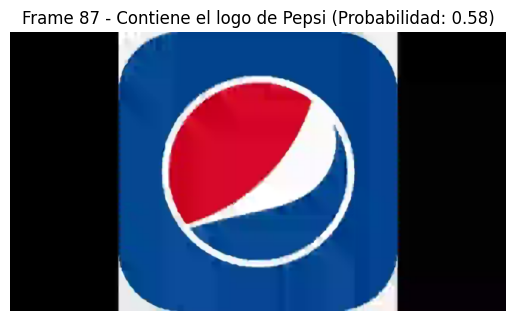

1/1 [==============================] - 0s 111ms/step


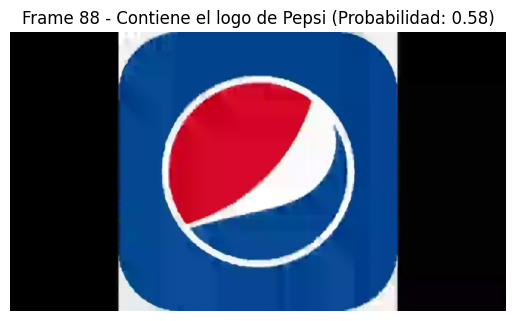

1/1 [==============================] - 0s 69ms/step


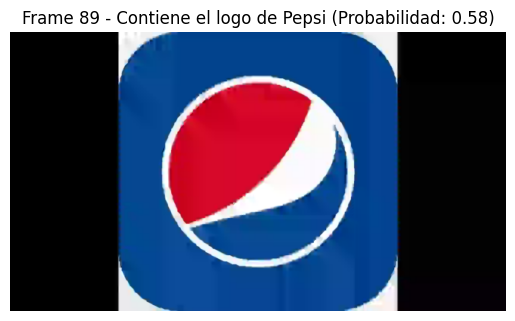

1/1 [==============================] - 0s 62ms/step


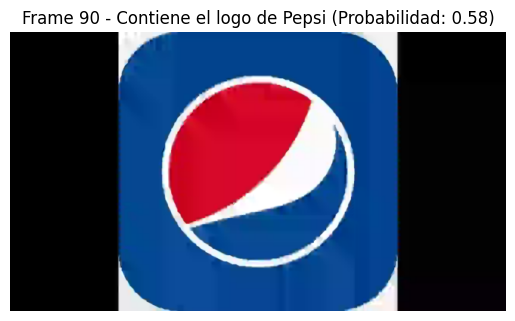

1/1 [==============================] - 0s 127ms/step


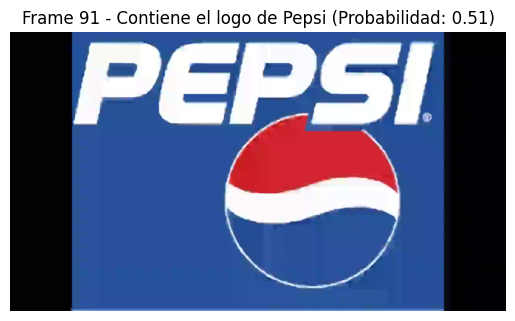

1/1 [==============================] - 0s 96ms/step


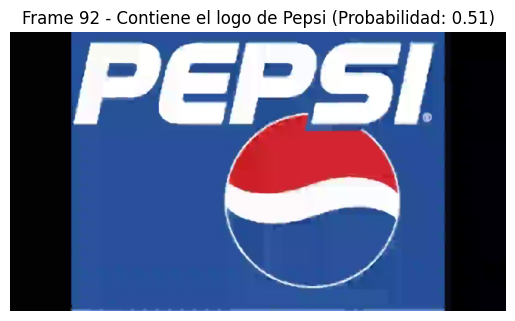

1/1 [==============================] - 0s 44ms/step


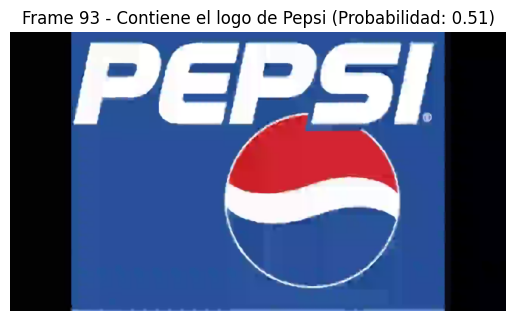

1/1 [==============================] - 0s 48ms/step


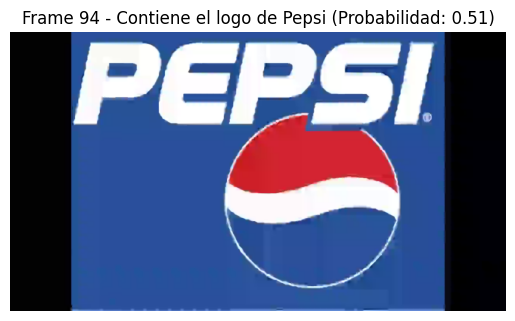

1/1 [==============================] - 0s 36ms/step


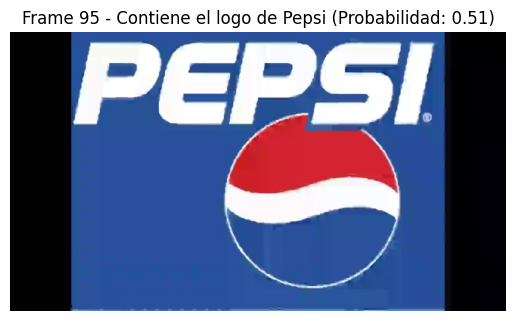

1/1 [==============================] - 0s 46ms/step


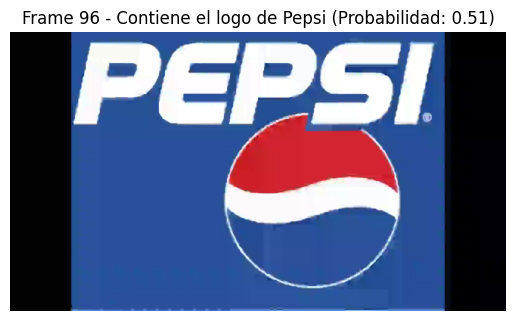

1/1 [==============================] - 0s 26ms/step


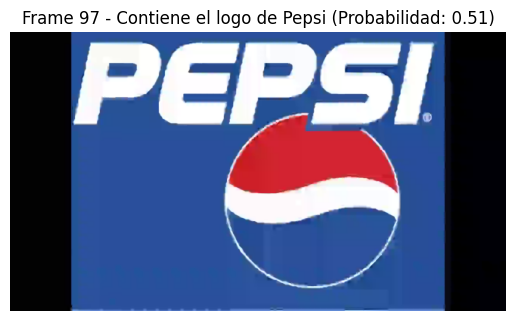

1/1 [==============================] - 0s 26ms/step


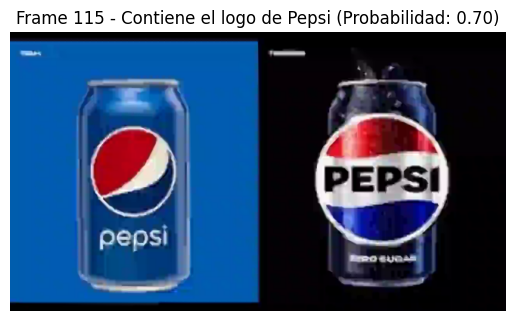

1/1 [==============================] - 0s 26ms/step


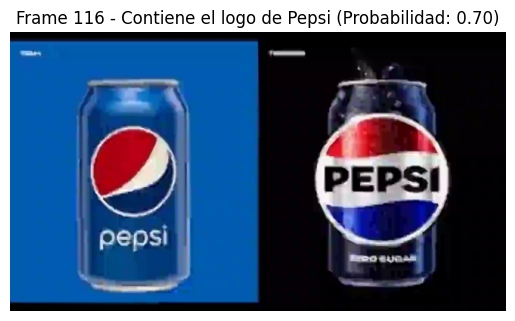

1/1 [==============================] - 0s 25ms/step


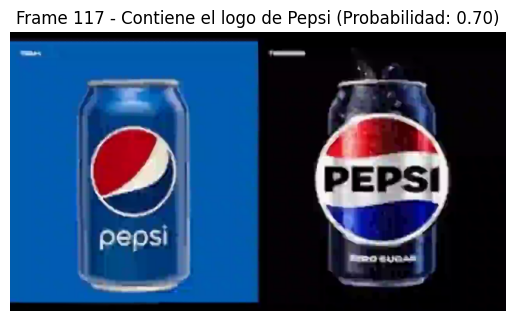

1/1 [==============================] - 0s 27ms/step


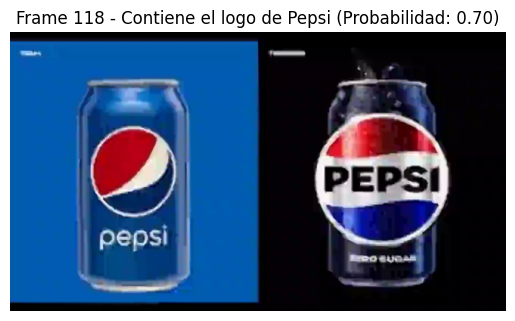

1/1 [==============================] - 0s 25ms/step


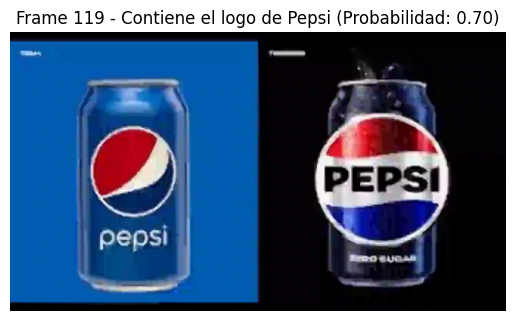

1/1 [==============================] - 0s 24ms/step


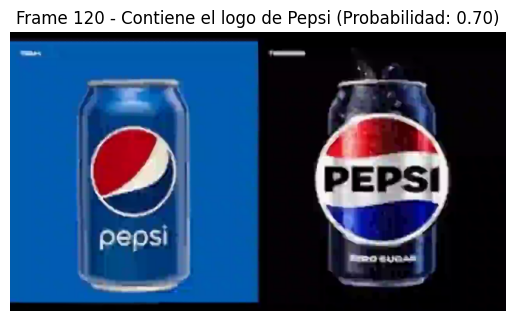

1/1 [==============================] - 0s 25ms/step


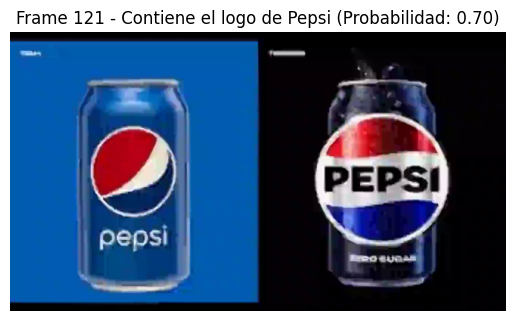

1/1 [==============================] - 0s 37ms/step


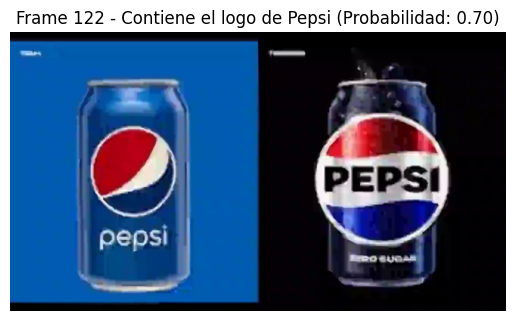

1/1 [==============================] - 0s 27ms/step


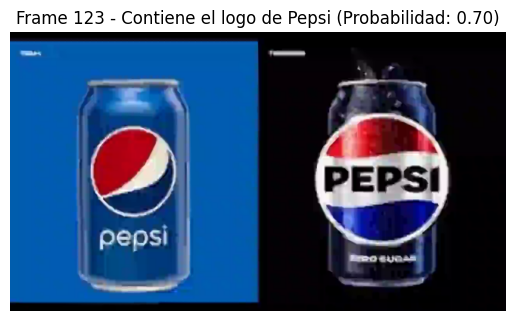

1/1 [==============================] - 0s 26ms/step


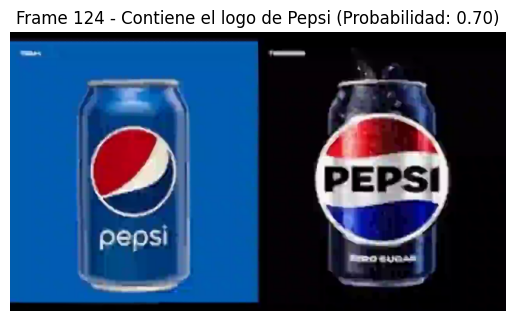

1/1 [==============================] - 0s 29ms/step


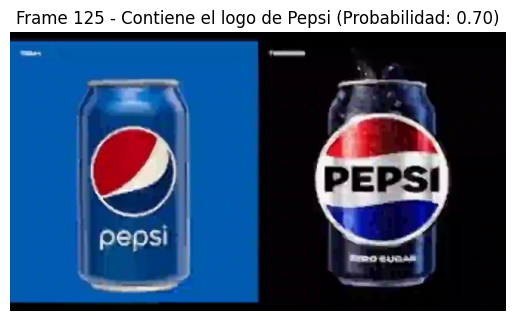

1/1 [==============================] - 0s 40ms/step


In [8]:
#Función para preprocesar la imagen antes de pasarla al modelo
def preprocesar_imagen(imagen):
    imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)
    imagen = cv2.resize(imagen, (128, 128))#Se cambia el tamaño de la imagen
    imagen = imagen / 255.0  # Se normalizan los valores
    return np.expand_dims(imagen, axis=0)

#Función para detectar el logo en un frame para una clase especifica
def detectar_logo(frame,clase_objetivo):
    # Preprocesar la imagen
    imagen_preprocesada = preprocesar_imagen(frame)

    # Realizar la predicción con el modelo
    predicciones = modelo.predict(imagen_preprocesada)
    clase_predicha = np.argmax(predicciones)
    probabilidad_prediccion = np.max(predicciones)

    # Definir las clases correspondientes a cada logo
    clases_logo = {0: 'Coca Cola',1: 'Pepsi'}

    # Verificar si la predicción corresponde al logo que estás buscando
    contiene_logo = clase_predicha == clase_objetivo

    return contiene_logo, probabilidad_prediccion, clases_logo[clase_predicha]

#Funcion para iterar sobre los frames y mostrar aquellos que contienen el logo de Pepsi
def imprimir_imagenes(clase_objetivo):
    for i in range(frame_count):
         frame_filename = os.path.join(output_folder, f'frame_{i+1:04d}.png')
         frame = cv2.imread(frame_filename)
         contiene_logo, probabilidad, clase_predicha = detectar_logo(frame,clase_objetivo)
         if contiene_logo:
       # Mostrar los frames en pantalla junto con la probabilidad de predicción
              plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
              plt.title(f'Frame {i+1} - Contiene el logo de {clase_predicha} (Probabilidad: {probabilidad:.2f})')
              plt.axis('off')
              plt.show()

#Se llama a la funcion imprimir_imagenes pasandole el valor 1, correspondiente a clase de Pepsi para imprmir todas las imagenes que se encuentren con esta marca
imprimir_imagenes(1)

1/1 [==============================] - 0s 20ms/step


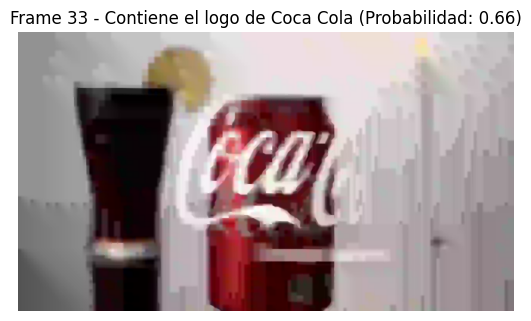

1/1 [==============================] - 0s 24ms/step


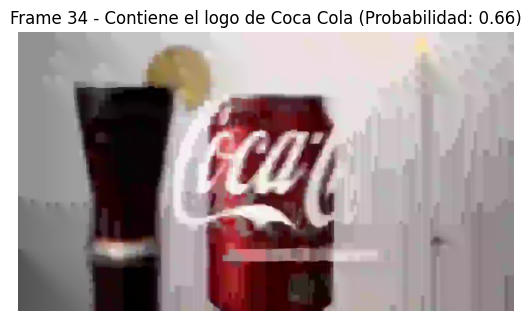

1/1 [==============================] - 0s 21ms/step


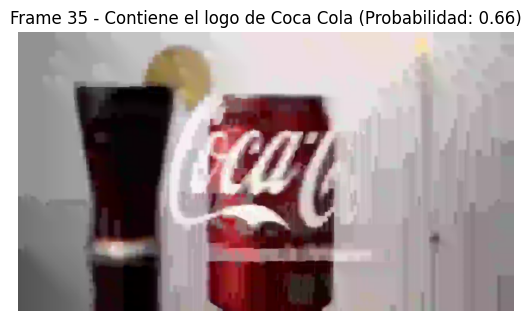

1/1 [==============================] - 0s 20ms/step


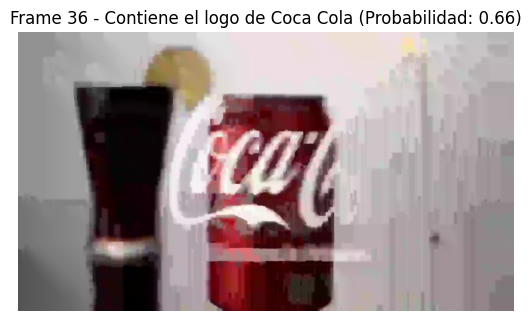

1/1 [==============================] - 0s 21ms/step


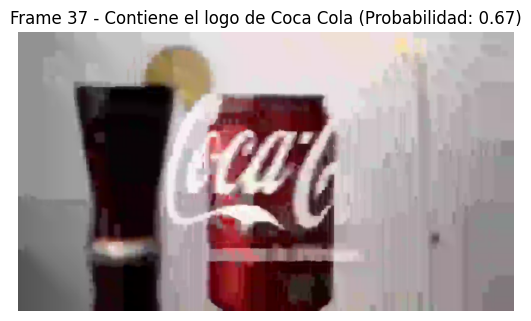

1/1 [==============================] - 0s 31ms/step


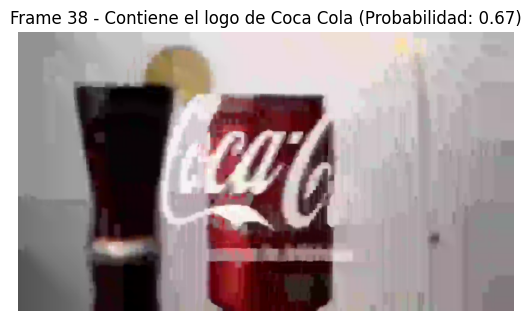

1/1 [==============================] - 0s 26ms/step


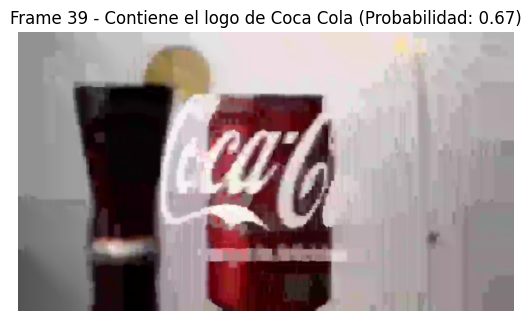

1/1 [==============================] - 0s 37ms/step


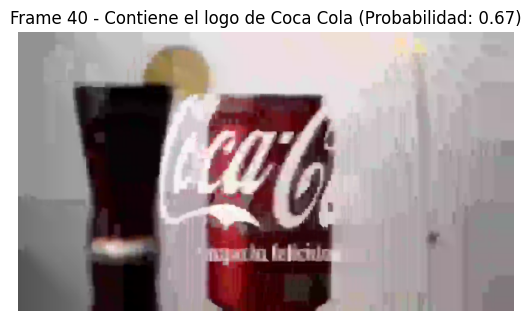

1/1 [==============================] - 0s 27ms/step


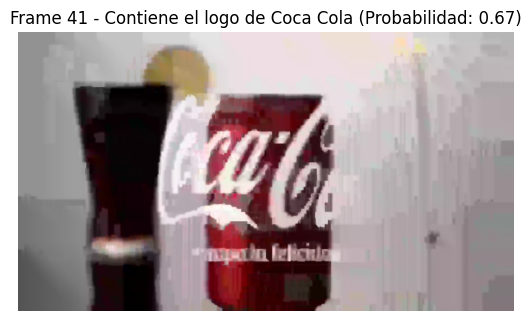

1/1 [==============================] - 0s 31ms/step


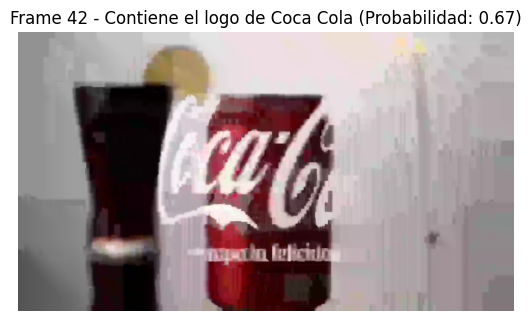

1/1 [==============================] - 0s 40ms/step


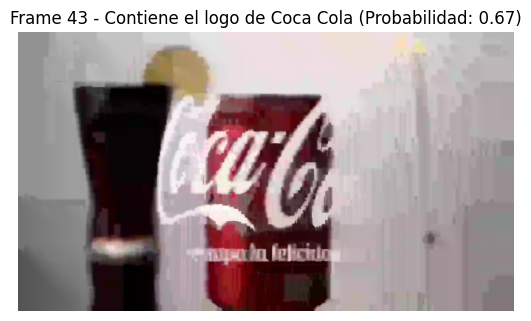

1/1 [==============================] - 0s 45ms/step


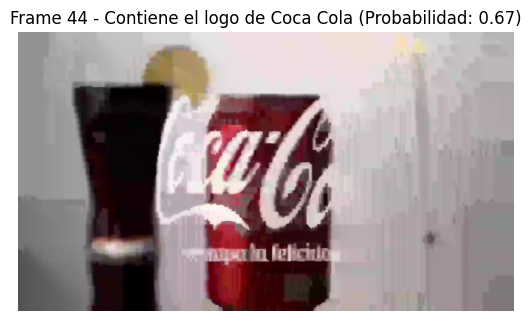

1/1 [==============================] - 0s 35ms/step


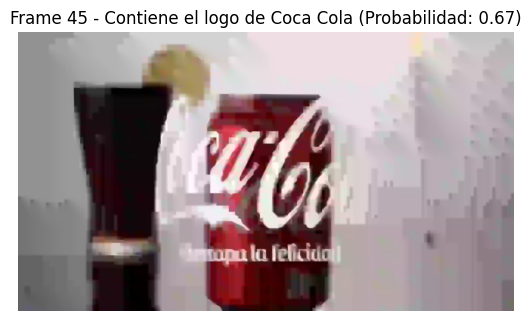

1/1 [==============================] - 0s 36ms/step


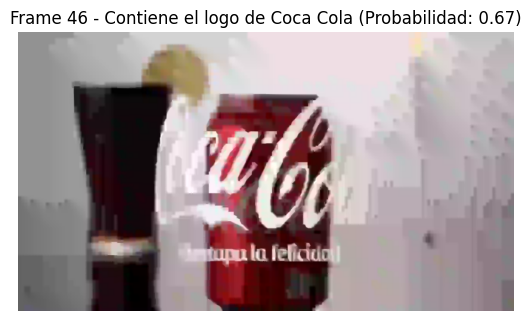

1/1 [==============================] - 0s 22ms/step


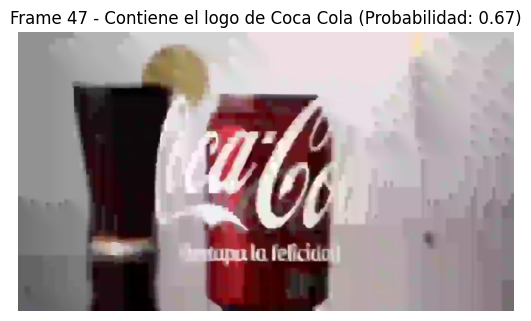

1/1 [==============================] - 0s 27ms/step


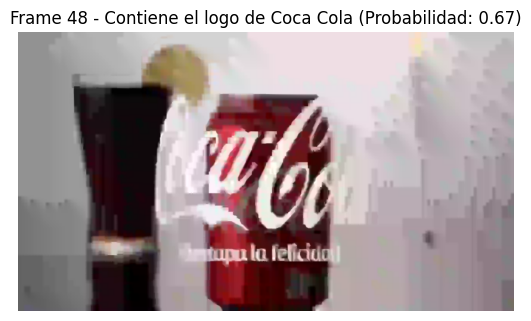

1/1 [==============================] - 0s 27ms/step


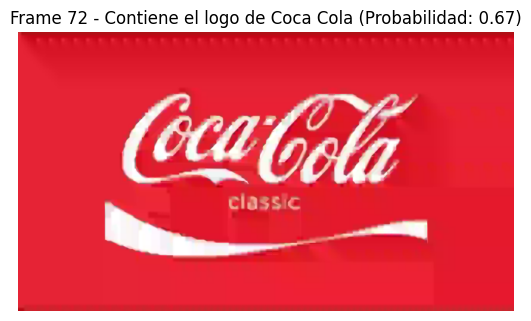

1/1 [==============================] - 0s 26ms/step


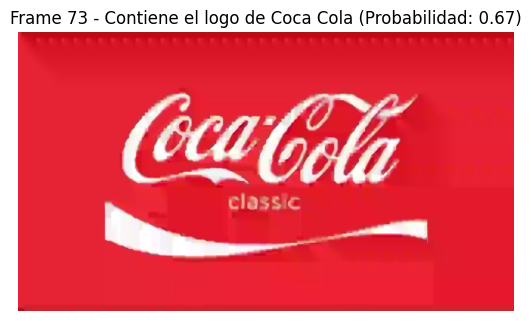

1/1 [==============================] - 0s 22ms/step


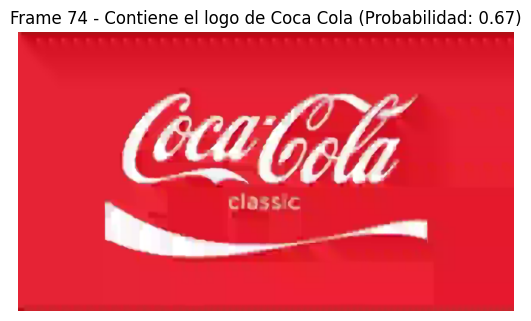

1/1 [==============================] - 0s 21ms/step


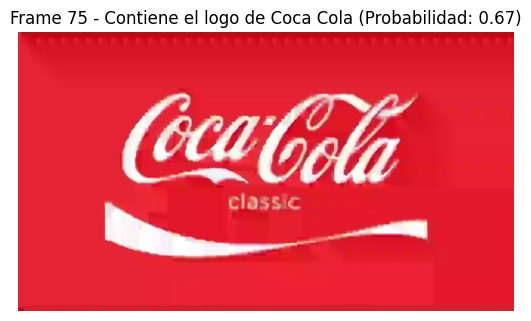

1/1 [==============================] - 0s 32ms/step


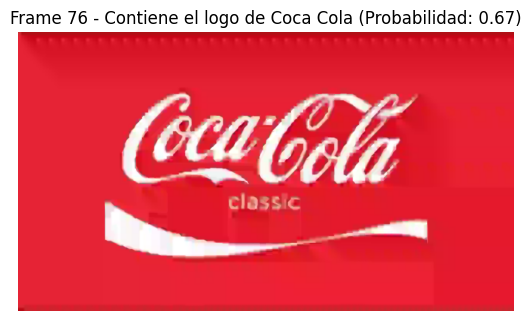

1/1 [==============================] - 0s 24ms/step


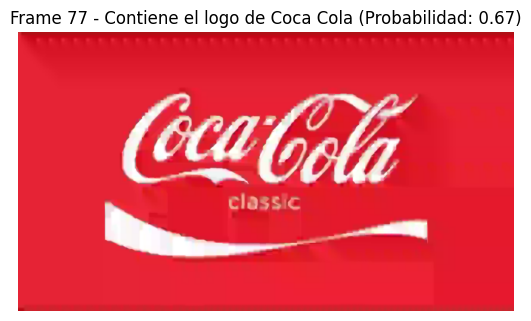

1/1 [==============================] - 0s 28ms/step


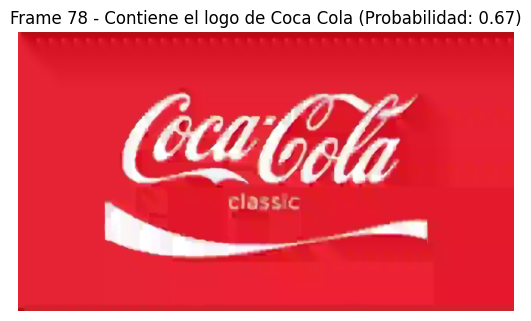

1/1 [==============================] - 0s 24ms/step


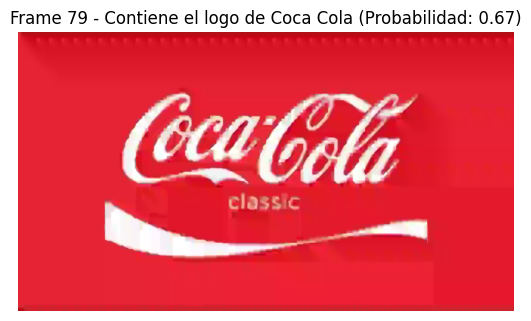

1/1 [==============================] - 0s 25ms/step


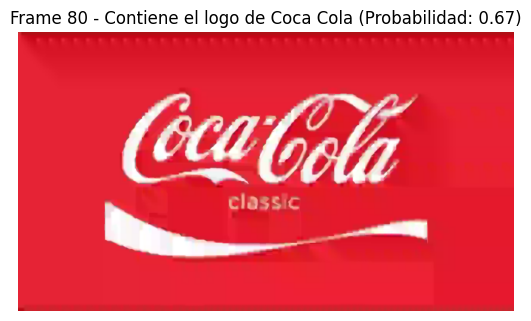

1/1 [==============================] - 0s 27ms/step


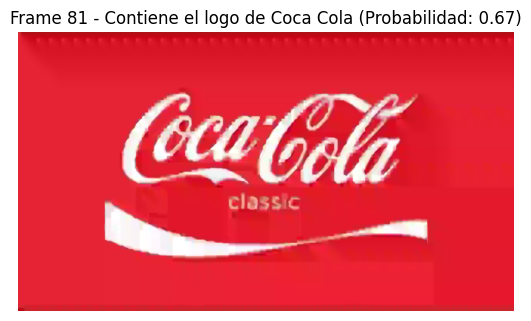

1/1 [==============================] - 0s 30ms/step


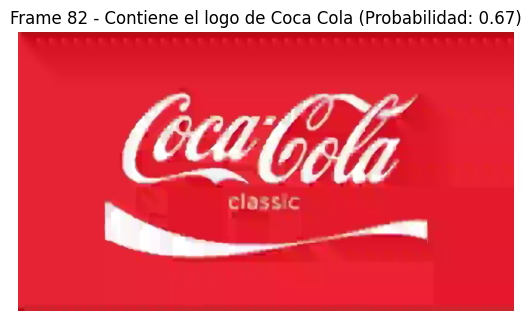

1/1 [==============================] - 0s 27ms/step


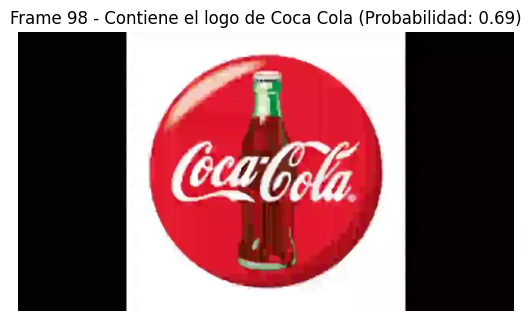

1/1 [==============================] - 0s 28ms/step


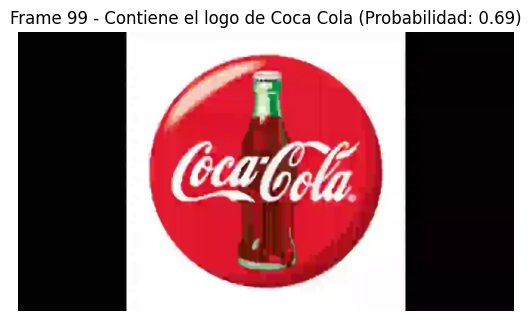

1/1 [==============================] - 0s 27ms/step


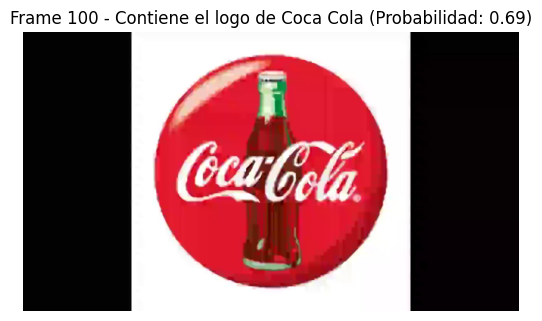

1/1 [==============================] - 0s 32ms/step


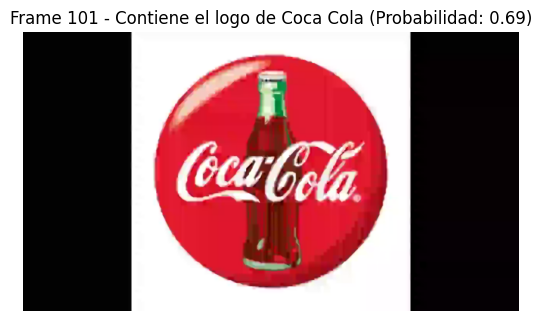

1/1 [==============================] - 0s 26ms/step


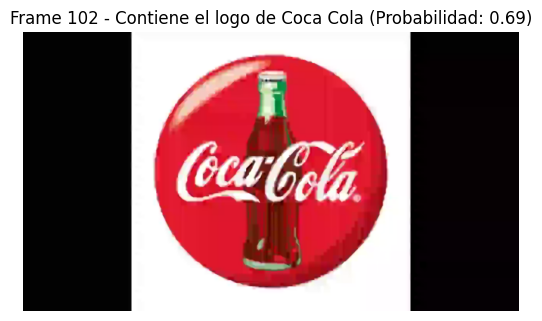

1/1 [==============================] - 0s 26ms/step


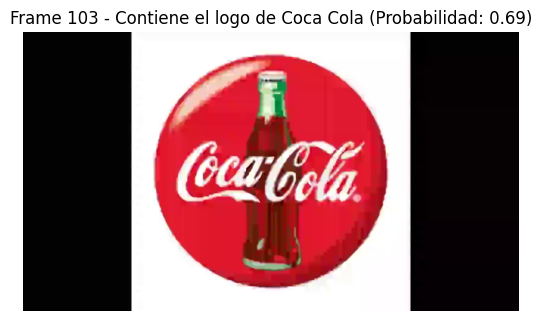

1/1 [==============================] - 0s 32ms/step


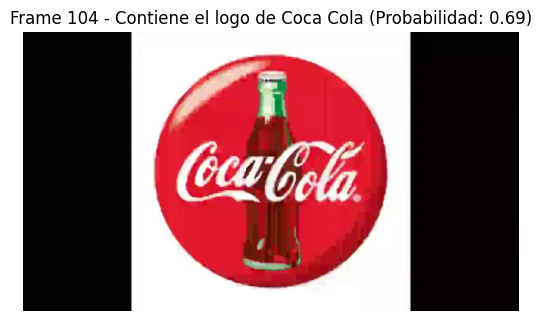

1/1 [==============================] - 0s 25ms/step


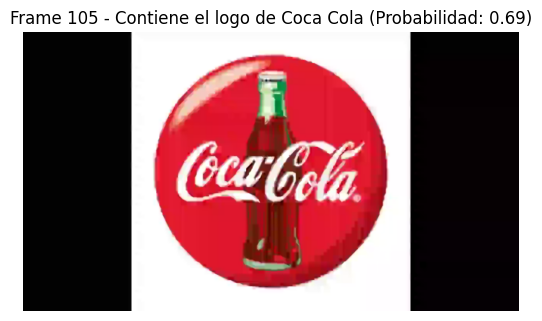

1/1 [==============================] - 0s 25ms/step


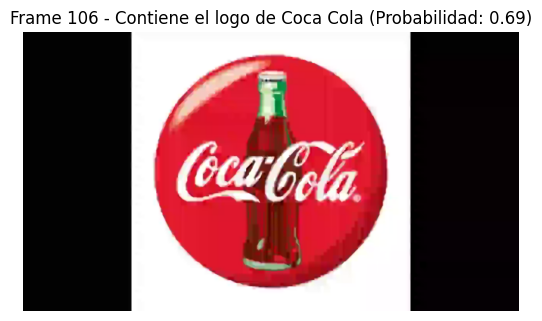

1/1 [==============================] - 0s 65ms/step


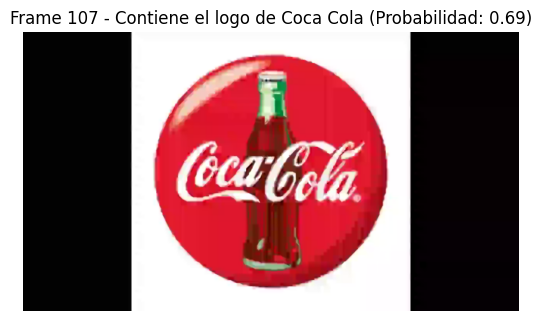

1/1 [==============================] - 0s 39ms/step


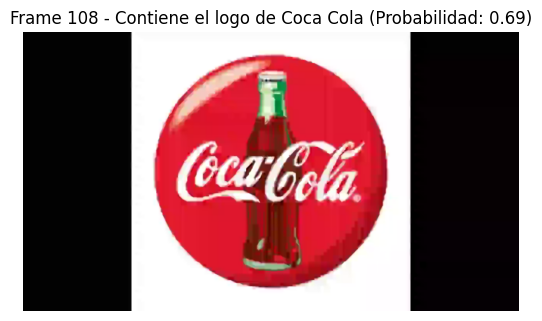

1/1 [==============================] - 0s 44ms/step


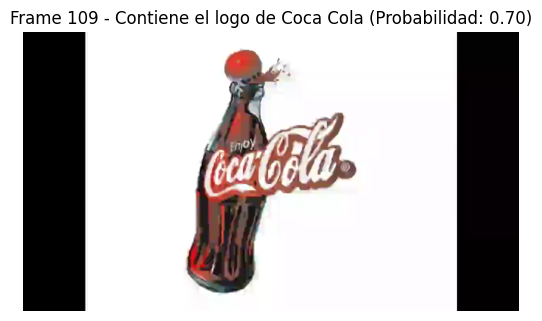

1/1 [==============================] - 0s 31ms/step


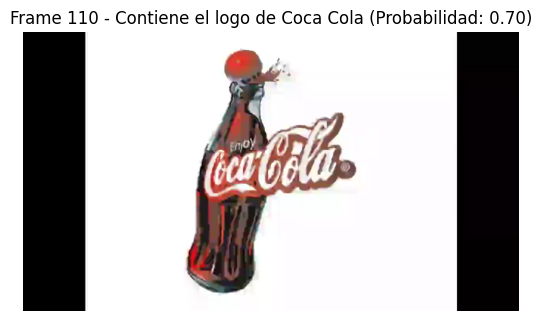

1/1 [==============================] - 0s 41ms/step


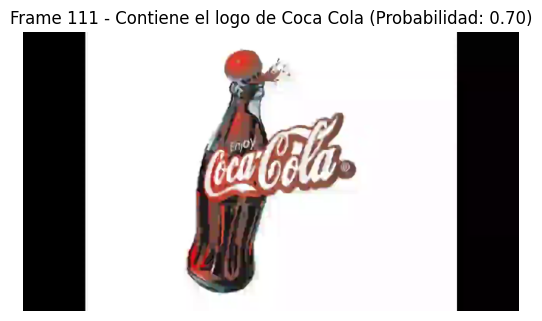

1/1 [==============================] - 0s 40ms/step


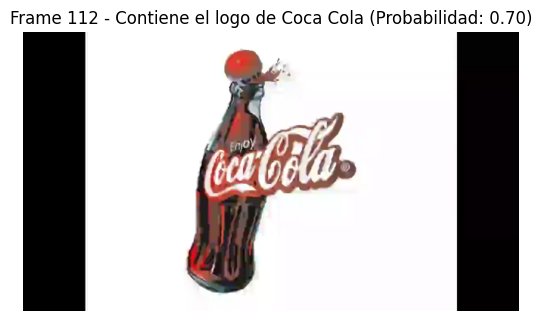

1/1 [==============================] - 0s 56ms/step


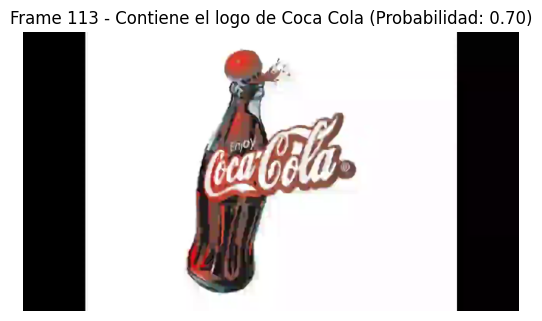

1/1 [==============================] - 0s 82ms/step


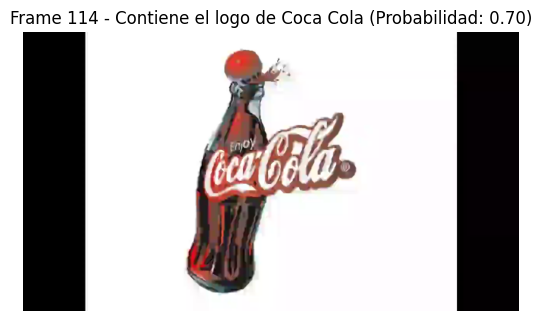

1/1 [==============================] - 0s 27ms/step


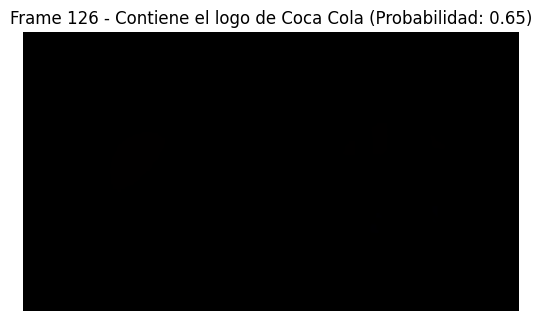

In [9]:
#Se llama a la funcion imprimir_imagenes pasandole el valor 0, correspondiente a clase de Coca Cola para imprimir todas las imagenes que se encuentren con esta marca
imprimir_imagenes(0)